In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('../data_file/fix_holiday_feature_train.csv')

/var/folders/__/r8r58jz17gj32tjwycl0m0hr0000gn/T/ipykernel_38477/4253068535.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../data_file/fix_holiday_feature_train.csv')


In [9]:
prediction_data = pd.read_csv('../data_file/8_24.csv')

In [10]:
prediction_data['date_time'] = prediction_data['num_date_time'].str.split('_').str[1].str.replace(' ', 'T')

In [11]:
def plot_graph(index):
    # Setting up the subplot grid
    fig, axes = plt.subplots(nrows=10, ncols=1, figsize=(10, 30))
    fig.tight_layout(pad=3.0)


    # Looping through buildings 1-10 and plotting their power consumption
    for building_num in range(index, index+10):
        # Extracting data for the current building from the original dataset
        building_data = data[data['building_number'] == building_num]

        # Extracting prediction data for the current building
        prediction_data_building = prediction_data[prediction_data['num_date_time'].str.startswith(f"{building_num}_")]

        # Calculating the subplot position
        ax = axes[building_num - index]

        # Plotting actual and predicted data
        ax.plot(pd.to_datetime(building_data['date_time']), building_data['power_consumption'], label='Actual', color='blue')
        ax.plot(pd.to_datetime(prediction_data_building['date_time']), prediction_data_building['answer'], label='Predicted', color='red')

        # Setting subplot title and labels
        ax.set_title(f'Building No.{building_num}')
        ax.set_xlabel('Date and Time')
        ax.set_ylabel('Power Consumption')
        #ax.legend()
        ax.grid(True)

    plt.show()

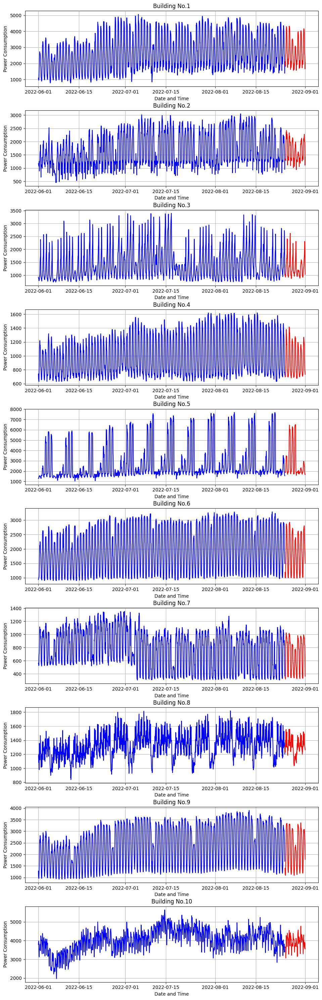

In [12]:
plot_graph(1)

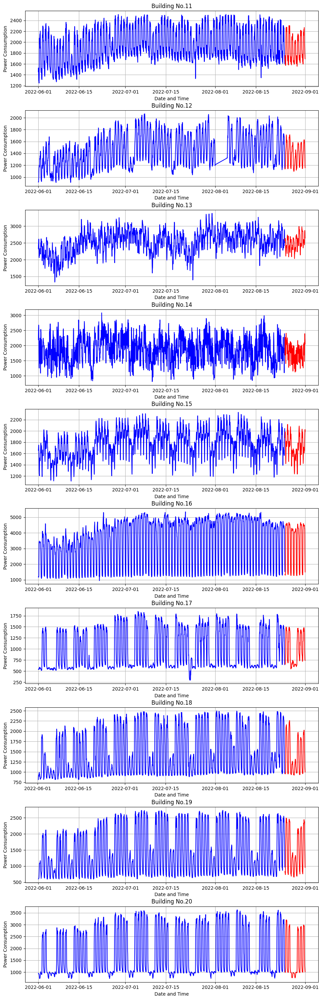

In [13]:
#8_22.csv
plot_graph(11)

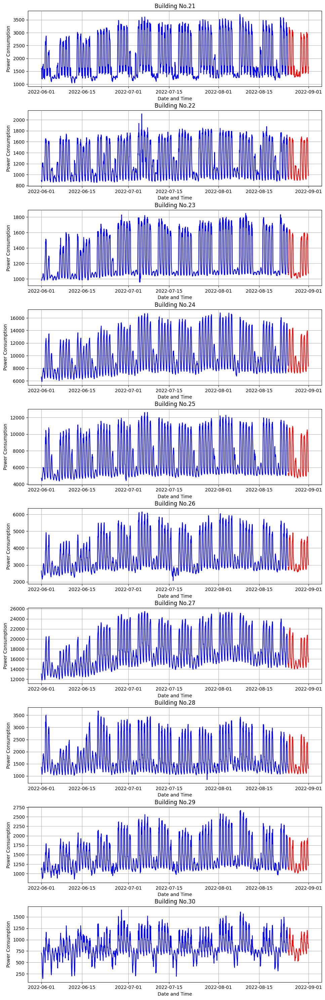

In [8]:
plot_graph(21)

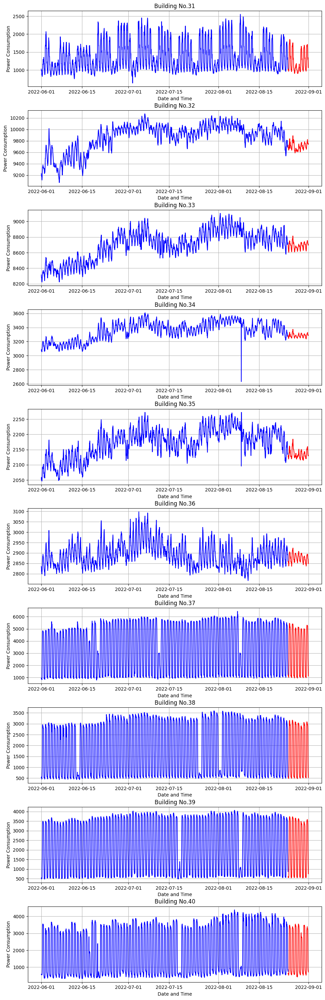

In [9]:
plot_graph(31)

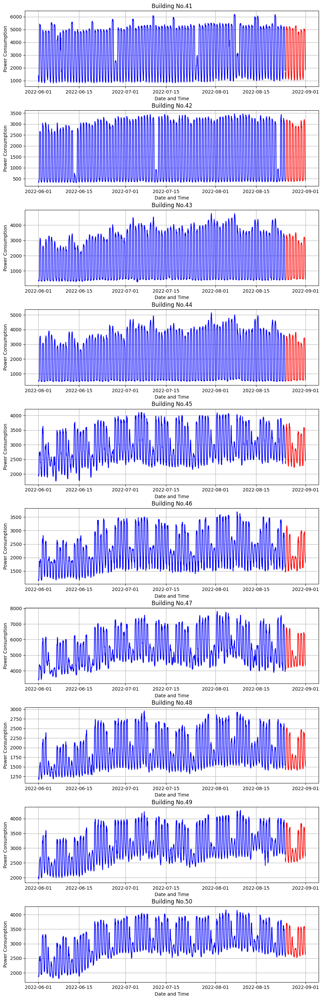

In [10]:
# 8_17.csv
plot_graph(41)

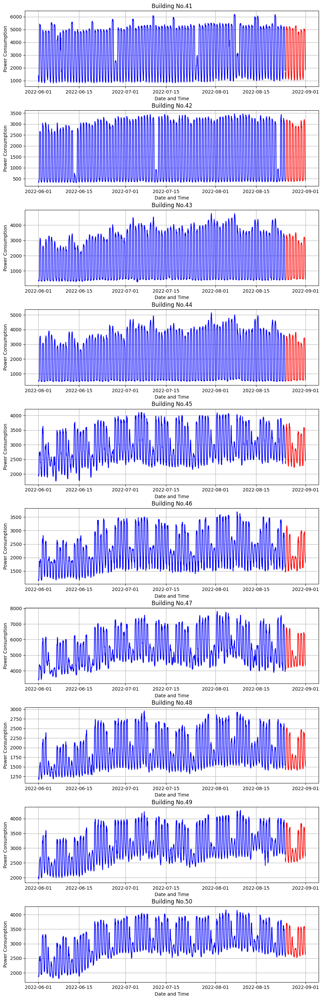

In [11]:
plot_graph(41)

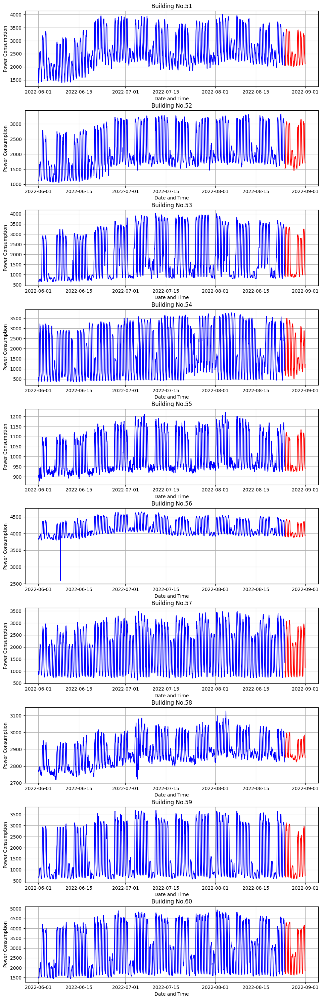

In [12]:
plot_graph(51)

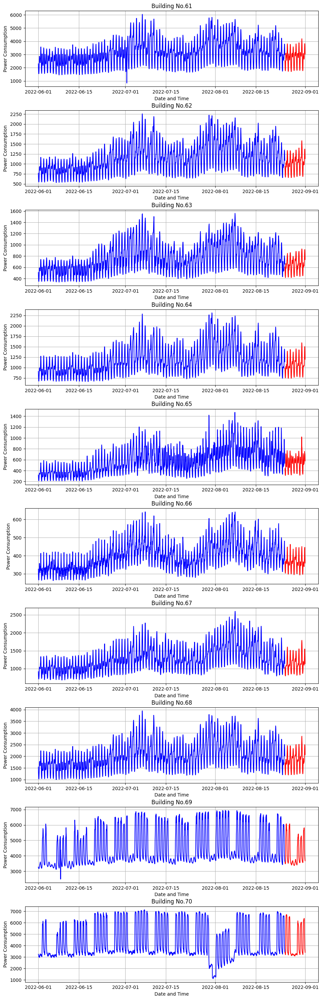

In [13]:
plot_graph(61)

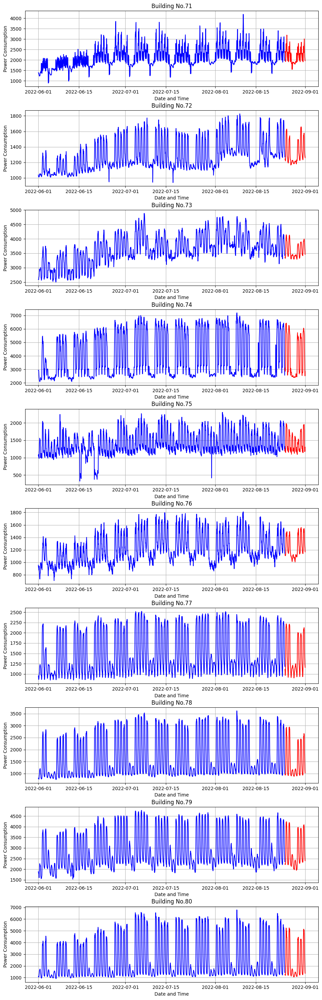

In [14]:
plot_graph(71)

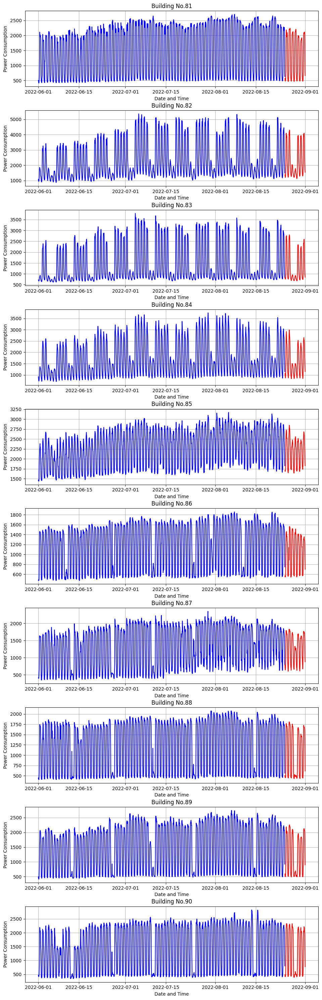

In [15]:
plot_graph(81)

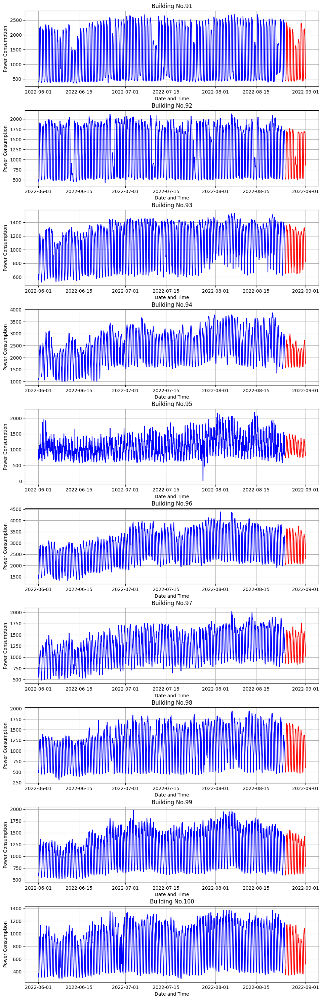

In [16]:
plot_graph(91)

In [18]:
prediction_data24 = pd.read_csv('../data_file/8_24.csv')

In [17]:
prediction_data22 = pd.read_csv('../data_file/8_22.csv')

In [24]:
prediction_data24[prediction_data24.index <= 3359]

,num_date_time,answer
0,1_20220825 00,2109.025130
1,1_20220825 01,2068.514374
2,1_20220825 02,1875.991325
3,1_20220825 03,1808.760693
4,1_20220825 04,1818.711916
...,...,...
3355,20_20220831 19,1269.246525
3356,20_20220831 20,1197.638045
3357,20_20220831 21,1130.148836
3358,20_20220831 22,1045.713380


In [26]:
prediction_data22[prediction_data22.index >= 3360]

,num_date_time,answer
3360,21_20220825 00,1671.826049
3361,21_20220825 01,1681.768492
3362,21_20220825 02,1669.439142
3363,21_20220825 03,1569.072427
3364,21_20220825 04,1378.192284
...,...,...
16795,100_20220831 19,918.198312
16796,100_20220831 20,797.332933
16797,100_20220831 21,718.750120
16798,100_20220831 22,640.060664


In [29]:
new_predict = pd.concat([prediction_data24[prediction_data24.index <= 3359], prediction_data22[prediction_data22.index >= 3360]])

In [32]:
new_predict.to_csv('new_8_24.csv', index=False)